# Hexagons (geohash) from H3 maintained by Uber

Medium article at https://gobert.medium.com/tutoriel-h3-g%C3%A9ocodage-en-python-a98afd4fda68, with code at https://github.com/gobert/medium/tree/master/h3

Official documentation: https://eng.uber.com/h3/

Official repo: https://github.com/uber/h3-py

Read more on geoJson: https://gobert.medium.com/comment-lire-et-utiliser-le-geojson-d1cab29892b2

In [1]:
# point of interest in latitude and longitude
# Berlin centre 
# lat, lon = 52.520008, 13.404954 # Berlin centre
lat, lon = 52.525084, 13.369402 # Berlin Central Station 
# lat, lon = 52.366667, 13.616667 # Zeuthen

# add also a Berlin boounding box and see where it fits on this plot
LIST_BBOX = [52.460460, 13.274762, 52.557030, 13.466936] # Berlin - small

INPUT_FOLDER_NAME = "/Users/abuzatu/Work/data/geo_spatial/Germany/Berlin"
INPUT_FILE_AREA_NAME = f"{INPUT_FOLDER_NAME}/berlin-shapes/berliner-bezirke.geojson"

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
from mpl_toolkits.axes_grid1 import make_axes_locatable
import geopandas as gpd
from shapely.geometry import Polygon
import contextily as ctx
import h3

import sys
sys.path.insert(1, '../')
import utils

%load_ext autoreload
%autoreload 2

In [3]:
# resolutions for h3
resolution = 9

Given a point's latitude and longitude, find the hexagon

In [4]:
# find the hexagon to which belongs this point of lat and lon; note it is of type string
hexagon = h3.geo_to_h3(lat, lon, resolution)
print(f"hexagon={hexagon}, type={type(hexagon)}")

hexagon=891f1d48813ffff, type=<class 'str'>


In [5]:
# let's visualize this hexagon overlaid on top of the street with maps below
# in a web browser go to this page and enter the hexagon number 891f1d48947ffff at
# the https://h3-to-geo.herokuapp.com

Given a hexagon, find the geoJson polygon of its six edges

In [6]:
# to plot the shape of this hexagon, we need the coordinates of its six edges as a tuple of of points
# for order (lat, lon) use geo_json = False
tuple_point = h3.h3_to_geo_boundary(hexagon, geo_json = False)
print(f"tuple_point: type={type(tuple_point)}")
tuple_point

tuple_point: type=<class 'tuple'>


((52.52655005963666, 13.368370528594841),
 (52.52491477897271, 13.368496137315098),
 (52.524251835126414, 13.371086220136185),
 (52.52522415681817, 13.373550793315237),
 (52.52685944926906, 13.373425305730281),
 (52.527522408242724, 13.37083512382873))

In [7]:
# for order (lon, lat) use geo_json = True
tuple_point = h3.h3_to_geo_boundary(hexagon, geo_json = True)
print(f"tuple_point: type={type(tuple_point)}")
tuple_point

tuple_point: type=<class 'tuple'>


((13.368370528594841, 52.52655005963666),
 (13.368496137315098, 52.52491477897271),
 (13.371086220136185, 52.524251835126414),
 (13.373550793315237, 52.52522415681817),
 (13.373425305730281, 52.52685944926906),
 (13.37083512382873, 52.527522408242724),
 (13.368370528594841, 52.52655005963666))

In [8]:
# still the tuple format is not enough
# to use directly other tools that need a geoJson format, let's convert to the geoJson format
# which is a list of list of list
# we need to transform the current tuple of tuple into a list of list
list(map(lambda h: list(h), h3.h3_to_geo_boundary(hexagon, geo_json = True)))

[[13.368370528594841, 52.52655005963666],
 [13.368496137315098, 52.52491477897271],
 [13.371086220136185, 52.524251835126414],
 [13.373550793315237, 52.52522415681817],
 [13.373425305730281, 52.52685944926906],
 [13.37083512382873, 52.527522408242724],
 [13.368370528594841, 52.52655005963666]]

In [9]:
# coordinates_geojson is a list of thosse above
coordinates_geojson = [list(map(lambda h: list(h), h3.h3_to_geo_boundary(hexagon, geo_json = True)))]
coordinates_geojson

[[[13.368370528594841, 52.52655005963666],
  [13.368496137315098, 52.52491477897271],
  [13.371086220136185, 52.524251835126414],
  [13.373550793315237, 52.52522415681817],
  [13.373425305730281, 52.52685944926906],
  [13.37083512382873, 52.527522408242724],
  [13.368370528594841, 52.52655005963666]]]

In [10]:
# the hexagon_geojson is a dictionary that uses coordinate_geojson
hexagon_geojson = {
    "type": "Polygon",
    "coordinates": coordinates_geojson,
}
hexagon_geojson

{'type': 'Polygon',
 'coordinates': [[[13.368370528594841, 52.52655005963666],
   [13.368496137315098, 52.52491477897271],
   [13.371086220136185, 52.524251835126414],
   [13.373550793315237, 52.52522415681817],
   [13.373425305730281, 52.52685944926906],
   [13.37083512382873, 52.527522408242724],
   [13.368370528594841, 52.52655005963666]]]}

In [11]:
# let's visualize this hexagon under the map
lat_point_list = [50.854457, 52.518172, 50.072651, 48.853033, 50.854457]
lon_point_list = [4.377184, 13.407759, 14.435935, 2.349553, 4.377184]
[zip(lon_point_list, lat_point_list)]

Given a hexagon, find the shapely Polygon of its six edges

POLYGON ((13.36837052859484 52.52655005963666, 13.3684961373151 52.52491477897271, 13.37108622013618 52.52425183512641, 13.37355079331524 52.52522415681817, 13.37342530573028 52.52685944926906, 13.37083512382873 52.52752240824272, 13.36837052859484 52.52655005963666))


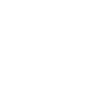

In [12]:
polygon_hexagon = Polygon(h3.h3_to_geo_boundary(hexagon, geo_json = True))
print(polygon_hexagon)
polygon_hexagon

In [13]:
# crs for lon, lat
crs = {'init': 'epsg:4326'}

In [14]:
# create geodataframe
gdf_hexagon = gpd.GeoDataFrame(index = [0], crs = crs, geometry = [polygon_hexagon])
gdf_hexagon

/Users/abuzatu/.pyenv/versions/3.8.6/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


,geometry
0,"POLYGON ((13.36837 52.52655, 13.36850 52.52491..."


<AxesSubplot:>

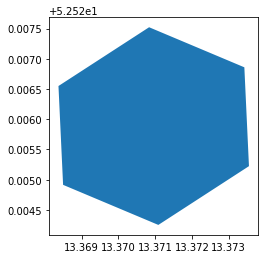

In [15]:
# plot gdf
gdf_hexagon.plot()

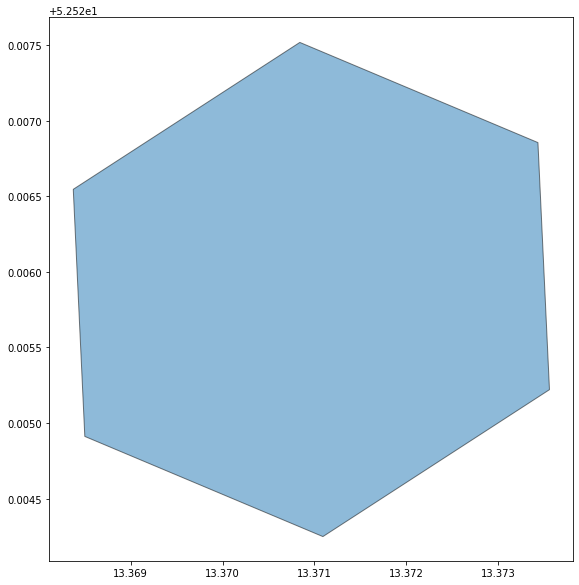

In [16]:
# plot nicer
ax = gdf_hexagon.plot(figsize=(10, 10), alpha=0.5, edgecolor='k')

We want to plot the street map under our hexagon. Here's a general example.

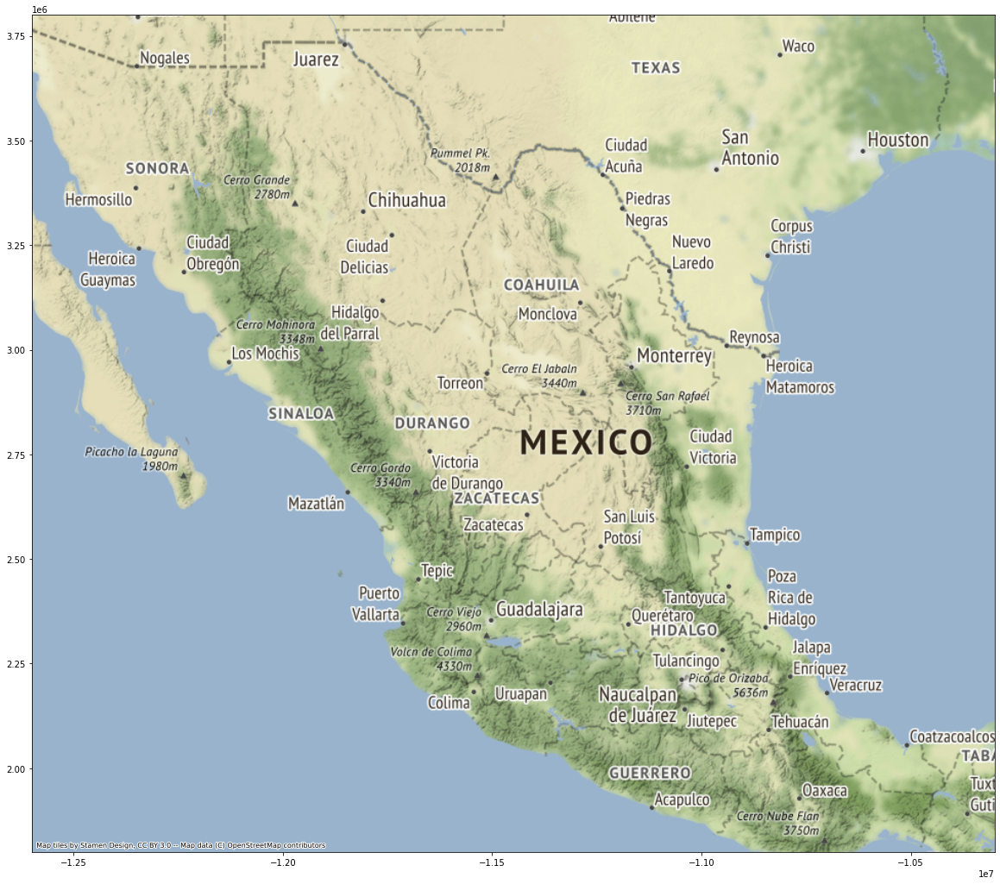

In [17]:
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
# we are using an extent around Mexico for the examples
# define the limits on the x and y axis but in the CRS https://en.wikipedia.org/wiki/Web_Mercator_projection
# to convert your gdf to this crs do gdf = gdf.to_crs(epsg=3857)
extent = (-12600000, -10300000, 1800000, 3800000)
ax.axis(extent)
ctx.add_basemap(ax) # by default Stamen Terrain
# see other web tile providers at https://contextily.readthedocs.io/en/latest/providers_deepdive.html
# source=ctx.providers.Stamen.TonerLite
# source=ctx.providers.OpenStreetMap.Mapnik

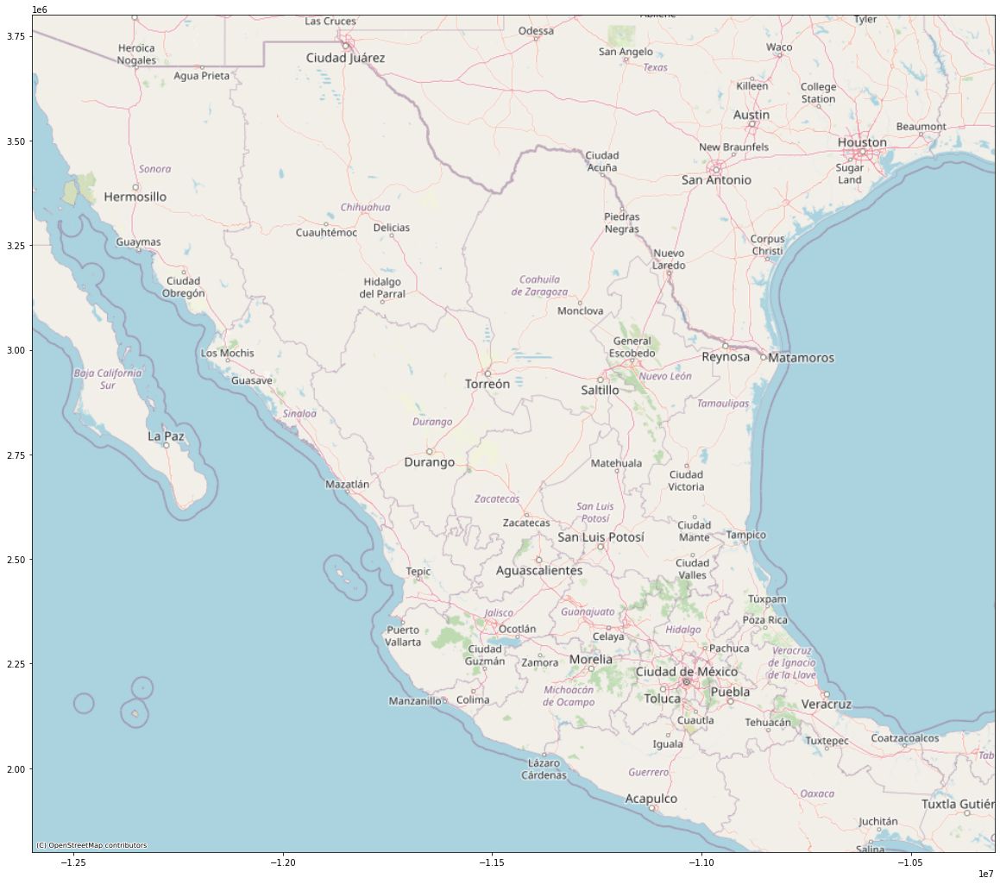

In [18]:
# same but with the OpenStreetMap below
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
# we are using an extent around Mexico for the examples
# define the limits on the x and y axis but in the CRS https://en.wikipedia.org/wiki/Web_Mercator_projection
# to convert your gdf to this crs do gdf = gdf.to_crs(epsg=3857)
extent = (-12600000, -10300000, 1800000, 3800000)
ax.axis(extent)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

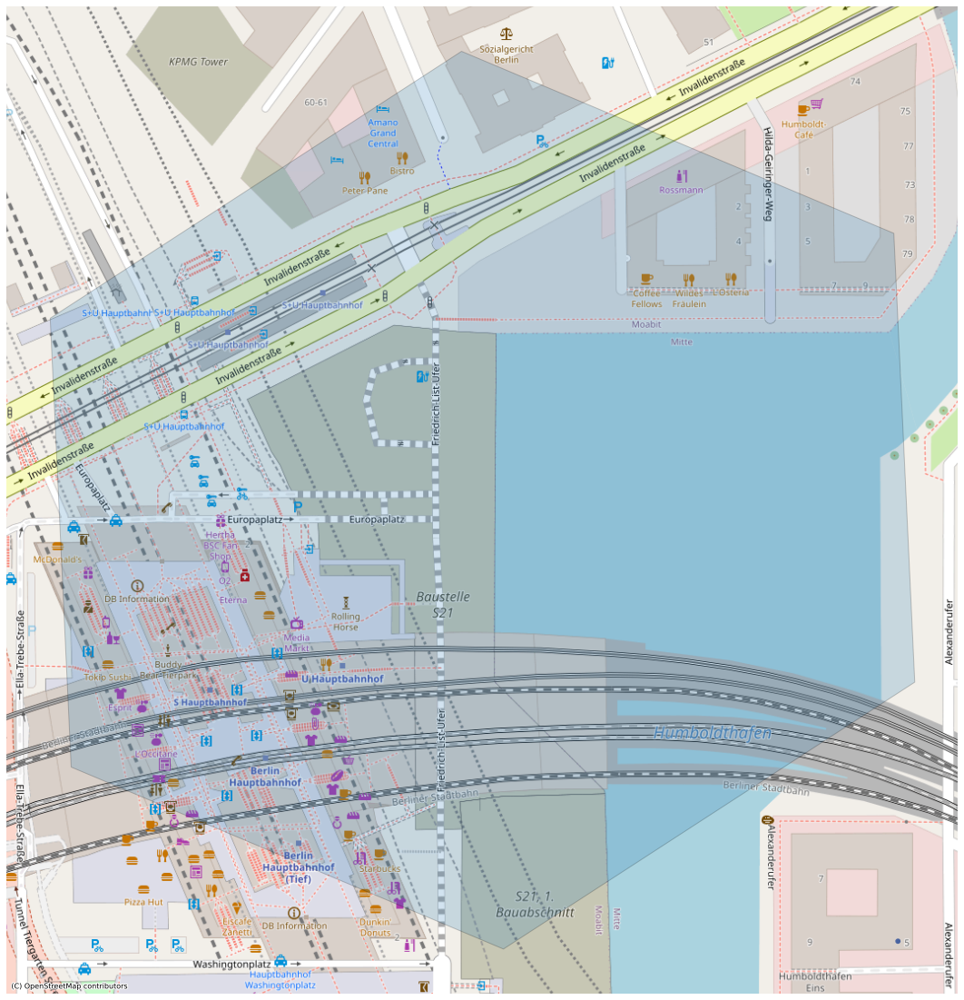

In [19]:
# plot the hexagon with the street map underneath the polygon
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
gdf_hexagon.to_crs(epsg = 3857).plot(ax = ax, alpha = 0.2, edgecolor = "k")
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_axis_off() # turn the axis values off

In [20]:
# look at the image in the context of the greater Berlin map to see easily where it fits
# we need to plot also another geo data frame with the Berlin Box
gdf_areas = gpd.read_file(INPUT_FILE_AREA_NAME)
gdf_areas

,gml_id,spatial_name,spatial_alias,spatial_type,geometry
0,re_bezirke.01,01,Mitte,Polygon,"POLYGON ((13.37325 52.50377, 13.37342 52.50399..."
1,re_bezirke.02,02,Friedrichshain-Kreuzberg,Polygon,"POLYGON ((13.44471 52.49422, 13.44498 52.49443..."
2,re_bezirke.03,03,Pankow,Polygon,"POLYGON ((13.44226 52.53097, 13.44561 52.52788..."
3,re_bezirke.04,04,Charlottenburg-Wilmersdorf,Polygon,"POLYGON ((13.30748 52.46788, 13.30833 52.46754..."
4,re_bezirke.05,05,Spandau,Polygon,"POLYGON ((13.21570 52.50936, 13.21570 52.50935..."
5,re_bezirke.06,06,Steglitz-Zehlendorf,Polygon,"POLYGON ((13.26906 52.40424, 13.27045 52.40416..."
6,re_bezirke.07,07,Tempelhof-Schöneberg,Polygon,"POLYGON ((13.41802 52.37623, 13.41951 52.37618..."
7,re_bezirke.08,08,Neukölln,Polygon,"POLYGON ((13.46090 52.42075, 13.46355 52.42108..."
8,re_bezirke.09,09,Treptow-Köpenick,Polygon,"POLYGON ((13.65750 52.35191, 13.65789 52.35204..."
9,re_bezirke.10,10,Marzahn-Hellersdorf,Polygon,"POLYGON ((13.58657 52.48101, 13.58878 52.48001..."


Text(0.5, 1.0, 'Berlin: 12 areas (Bezirke) and one hexagon')

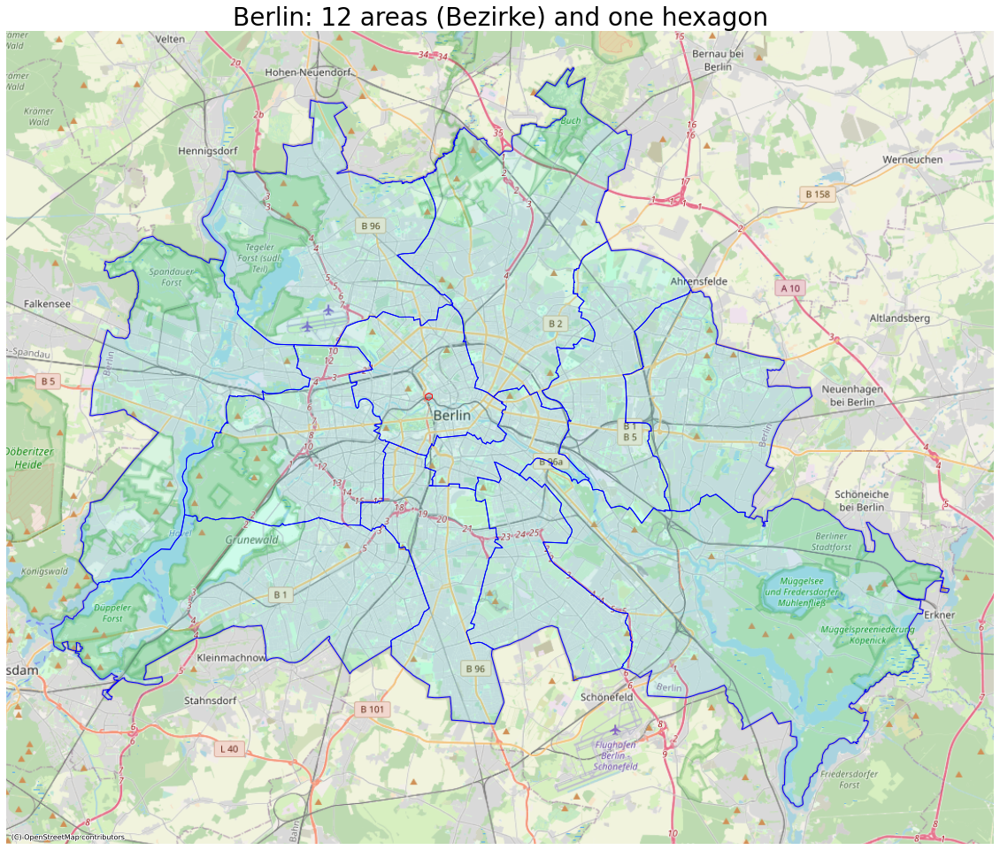

In [21]:
# create figure
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

if True:
    # plot counties
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("cyan", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("blue", alpha=1.0)
    gdf_areas.to_crs(epsg = 3857).plot(ax = ax, 
                   facecolor=polygon_color_face,
                   edgecolor=polygon_color_edge,
                   linewidth = 1,
                  )
if True:
    # plot hexagon
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("red", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("red", alpha=1.0)
    gdf_hexagon.to_crs(epsg = 3857).plot(ax = ax, 
               facecolor=polygon_color_face,
               edgecolor=polygon_color_edge,
               linewidth = 1,
              )
# plot basemap below
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_axis_off() # turn the axis values off
plt.xlabel("Longitude", fontsize = 18)
plt.ylabel("Latitude", fontsize = 18)
plt.title(f"Berlin: {len(gdf_areas)} areas (Bezirke) and one hexagon", fontsize = 28)

In [22]:
def get_polygon_bbox(
    list_bbox: list,
):
    '''
    Find the shapely.geometry.Polygon from the bounding box.
    list_bbox = [52.460460, 13.274762, 52.557030, 13.466936] # Berlin
    order is lat1, lon1, lat2, lon2
    but for the Polygon the order must be lon, then lat, so x and then y
    '''
    polygon = Polygon(
        [
                [list_bbox[1], list_bbox[0]],
                [list_bbox[1], list_bbox[2]],
                [list_bbox[3], list_bbox[2]],
                [list_bbox[3], list_bbox[0]],
                [list_bbox[1], list_bbox[0]],
        ]
    )
    return polygon

POLYGON ((13.274762 52.46046, 13.274762 52.55703, 13.466936 52.55703, 13.466936 52.46046, 13.274762 52.46046))


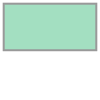

In [23]:
polygon_bbox = get_polygon_bbox(LIST_BBOX)
print(polygon_bbox)
polygon_bbox

In [24]:
# create geodataframe
gdf_bbox = gpd.GeoDataFrame(index = [0], crs = crs, geometry = [polygon_bbox])
gdf_bbox

/Users/abuzatu/.pyenv/versions/3.8.6/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


,geometry
0,"POLYGON ((13.27476 52.46046, 13.27476 52.55703..."


Text(0.5, 1.0, 'Berlin: 12 areas (Bezirke); the bounding box; one hexagon')

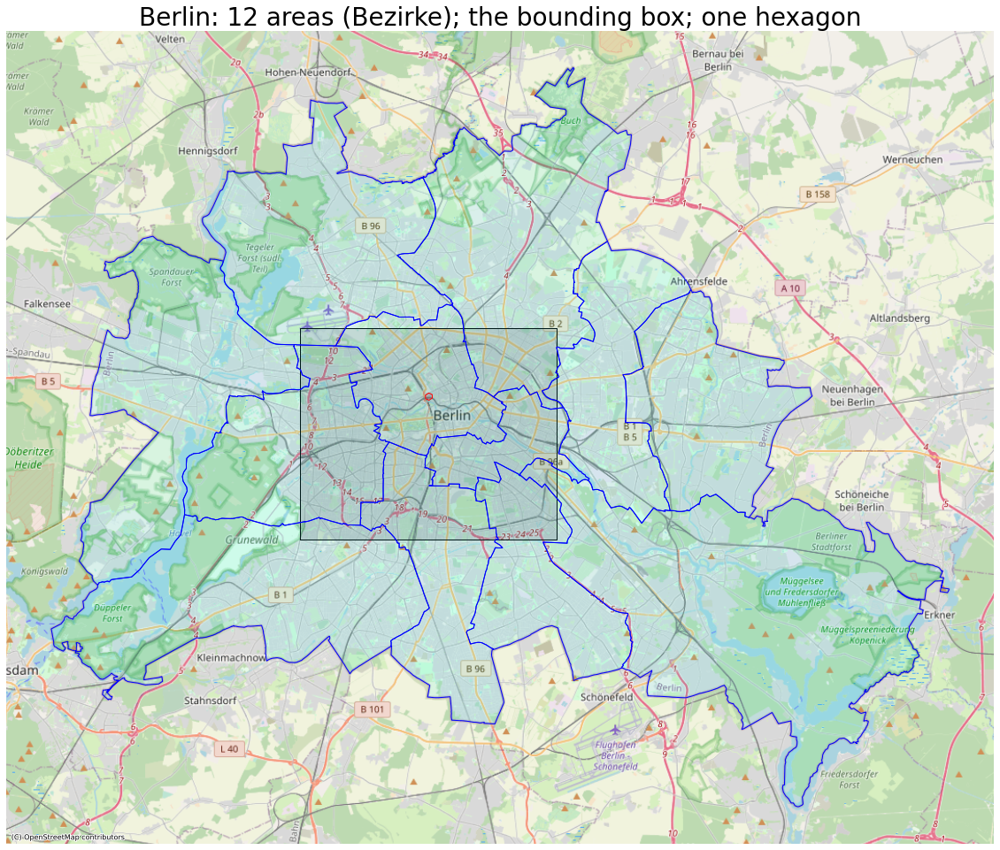

In [25]:
# create figure
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

if True:
    # plot bbox
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("black", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("black", alpha=1.0)
    gdf_bbox.to_crs(epsg = 3857).plot(ax = ax, 
               facecolor=polygon_color_face,
               edgecolor=polygon_color_edge,
               linewidth = 1,
              )
if True:
    # plot counties
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("cyan", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("blue", alpha=1.0)
    gdf_areas.to_crs(epsg = 3857).plot(ax = ax, 
                   facecolor=polygon_color_face,
                   edgecolor=polygon_color_edge,
                   linewidth = 1,
                  )
if True:
    # plot hexagon
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("red", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("red", alpha=1.0)
    gdf_hexagon.to_crs(epsg = 3857).plot(ax = ax, 
               facecolor=polygon_color_face,
               edgecolor=polygon_color_edge,
               linewidth = 1,
              )
# plot basemap below
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_axis_off() # turn the axis values off
plt.xlabel("Longitude", fontsize = 18)
plt.ylabel("Latitude", fontsize = 18)
plt.title(f"Berlin: {len(gdf_areas)} areas (Bezirke); the bounding box; one hexagon", fontsize = 28)

In [26]:
# find all the hexagons in a polygon, like the bounding box from above
def get_geojson_bbox(
    list_bbox: list,
):
    '''
    Find the geojson from the bounding box.
    list_bbox = [52.460460, 13.274762, 52.557030, 13.466936] # Berlin
    '''
    geojson_bbox = {
        "type": "Polygon",
        "coordinates": [
            [
                [list_bbox[0], list_bbox[1]],
                [list_bbox[0], list_bbox[3]],
                [list_bbox[2], list_bbox[3]],
                [list_bbox[2], list_bbox[1]],
                [list_bbox[0], list_bbox[1]],
            ]
        ]
    }
    return geojson_bbox
geojson_bbox = get_geojson_bbox(LIST_BBOX)
geojson_bbox

{'type': 'Polygon',
 'coordinates': [[[52.46046, 13.274762],
   [52.46046, 13.466936],
   [52.55703, 13.466936],
   [52.55703, 13.274762],
   [52.46046, 13.274762]]]}

In [27]:
set_hexagon = h3.polyfill(geojson = geojson_bbox,
                          res = resolution,
                         )
print("set_hexagon, type={set_hexagon}")
set_hexagon

set_hexagon, type={set_hexagon}


{'891f18b20a3ffff',
 '891f1d4aa27ffff',
 '891f18b213bffff',
 '891f1d49b3bffff',
 '891f1d49ab3ffff',
 '891f1d48d8fffff',
 '891f1d481d3ffff',
 '891f1d4d043ffff',
 '891f1d49b4bffff',
 '891f1d4d0cfffff',
 '891f1d49d37ffff',
 '891f1d49b73ffff',
 '891f1d49ea7ffff',
 '891f1d4d69bffff',
 '891f1d4995bffff',
 '891f1d48b4fffff',
 '891f1d48a43ffff',
 '891f18b2c4bffff',
 '891f1d4aacbffff',
 '891f1d48aabffff',
 '891f18b2453ffff',
 '891f1d48e3bffff',
 '891f1d4d457ffff',
 '891f1d4f067ffff',
 '891f1d48567ffff',
 '891f1d4851bffff',
 '891f1d48903ffff',
 '891f1d48d2bffff',
 '891f1d488cfffff',
 '891f18b21cbffff',
 '891f18b25dbffff',
 '891f18b2583ffff',
 '891f1d4830bffff',
 '891f1d49c23ffff',
 '891f1d49babffff',
 '891f1d48b9bffff',
 '891f1d4aa1bffff',
 '891f1d4803bffff',
 '891f1d48e47ffff',
 '891f1d48873ffff',
 '891f1d4d06bffff',
 '891f1d49abbffff',
 '891f1d48137ffff',
 '891f1d499afffff',
 '891f1d4d46bffff',
 '891f1d48837ffff',
 '891f1d48353ffff',
 '891f1d4f06fffff',
 '891f1d49eafffff',
 '891f1d4aa43ffff',


In [28]:
# let's create a geodataframe with the polygon shape of all of them
# then plot them on our plot
# let's create first a data frame with the hexagons
df_hash = pd.DataFrame(set_hexagon, columns = ["hexagon"])
df_hash

,hexagon
0,891f18b20a3ffff
1,891f1d4aa27ffff
2,891f18b213bffff
3,891f1d49b3bffff
4,891f1d49ab3ffff
...,...
1485,891f18b26cfffff
1486,891f1d49ca3ffff
1487,891f1d48387ffff
1488,891f1d488b3ffff


In [29]:
# add a new column denoted geometry with the polygons of the edges of each hexagon
df_hash["geometry"] = df_hash.hexagon.map(lambda hexagon: Polygon(h3.h3_to_geo_boundary(hexagon, geo_json = True)))
df_hash

,hexagon,geometry
0,891f18b20a3ffff,"POLYGON ((13.40244504073591 52.47932423488762,..."
1,891f1d4aa27ffff,"POLYGON ((13.35093846763875 52.5550477814059, ..."
2,891f18b213bffff,"POLYGON ((13.43584273618479 52.47395546927712,..."
3,891f1d49b3bffff,"POLYGON ((13.32977587196416 52.46747349066241,..."
4,891f1d49ab3ffff,"POLYGON ((13.29366979579924 52.47511061620672,..."
...,...,...
1485,891f18b26cfffff,"POLYGON ((13.34726051648194 52.47101523340909,..."
1486,891f1d49ca3ffff,"POLYGON ((13.29371180688766 52.50716640604656,..."
1487,891f1d48387ffff,"POLYGON ((13.30228922404096 52.52741389187404,..."
1488,891f1d488b3ffff,"POLYGON ((13.37810408269894 52.53207428563524,..."


In [30]:
# convert data frame to geodata frame with the crs that belongs t lon, lat
gdf_hash = gpd.GeoDataFrame(df_hash, geometry = "geometry", crs = crs)
gdf_hash

/Users/abuzatu/.pyenv/versions/3.8.6/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


,hexagon,geometry
0,891f18b20a3ffff,"POLYGON ((13.40245 52.47932, 13.40257 52.47769..."
1,891f1d4aa27ffff,"POLYGON ((13.35094 52.55505, 13.35106 52.55341..."
2,891f18b213bffff,"POLYGON ((13.43584 52.47396, 13.43597 52.47232..."
3,891f1d49b3bffff,"POLYGON ((13.32978 52.46747, 13.32990 52.46584..."
4,891f1d49ab3ffff,"POLYGON ((13.29367 52.47511, 13.29380 52.47347..."
...,...,...
1485,891f18b26cfffff,"POLYGON ((13.34726 52.47102, 13.34739 52.46938..."
1486,891f1d49ca3ffff,"POLYGON ((13.29371 52.50717, 13.29384 52.50553..."
1487,891f1d48387ffff,"POLYGON ((13.30229 52.52741, 13.30242 52.52578..."
1488,891f1d488b3ffff,"POLYGON ((13.37810 52.53207, 13.37823 52.53044..."


<AxesSubplot:>

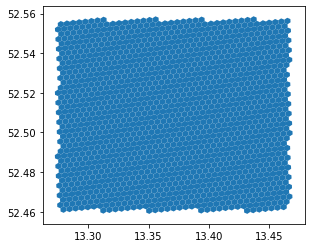

In [31]:
# plot them
gdf_hash.plot()

Text(0.5, 1.0, 'Berlin: 12 areas (Bezirke); the bounding box; one hexagon')

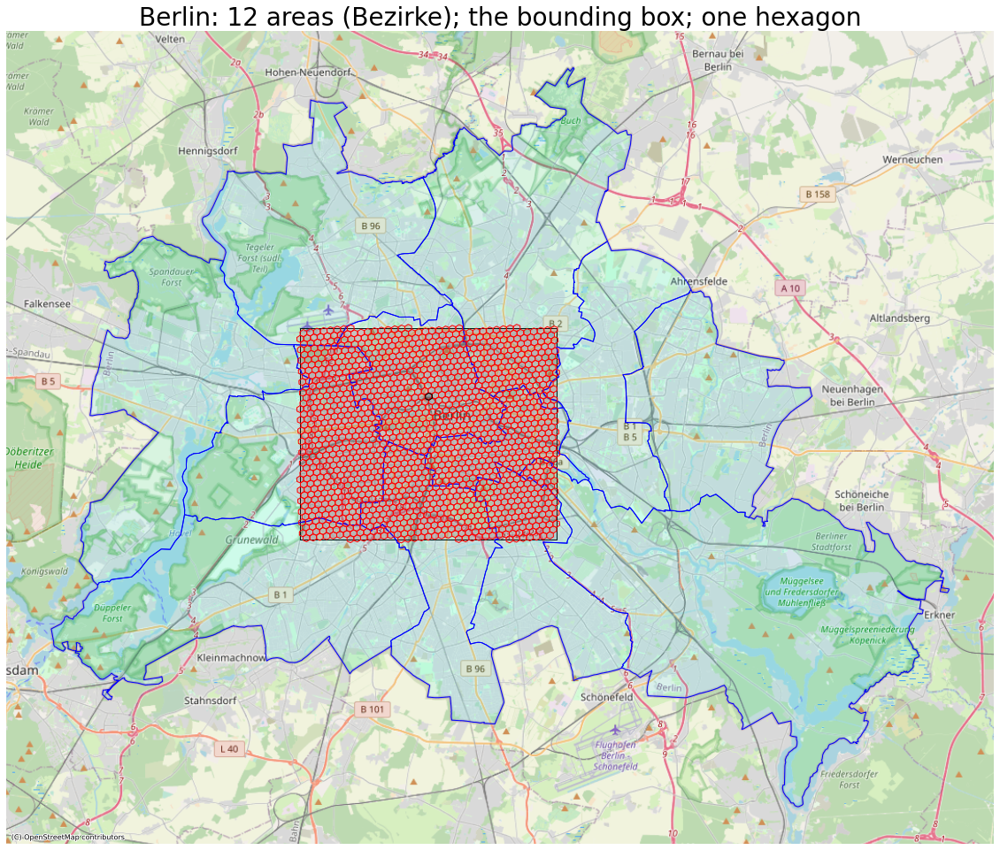

In [32]:
# plot along with the rest
# create figure
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

if True:
    # plot bbox
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("black", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("black", alpha=1.0)
    gdf_bbox.to_crs(epsg = 3857).plot(ax = ax, 
               facecolor=polygon_color_face,
               edgecolor=polygon_color_edge,
               linewidth = 1,
              )
if True:
    # plot counties
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("cyan", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("blue", alpha=1.0)
    gdf_areas.to_crs(epsg = 3857).plot(ax = ax, 
                   facecolor=polygon_color_face,
                   edgecolor=polygon_color_edge,
                   linewidth = 1,
                  )
if True:
    # plot hash of hexagons
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("red", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("red", alpha=1.0)
    gdf_hash.to_crs(epsg = 3857).plot(ax = ax, 
               facecolor=polygon_color_face,
               edgecolor=polygon_color_edge,
               linewidth = 1,
              )
    
if True:
    # plot one chosen hexagon
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("black", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("black", alpha=1.0)
    gdf_hexagon.to_crs(epsg = 3857).plot(ax = ax, 
               facecolor=polygon_color_face,
               edgecolor=polygon_color_edge,
               linewidth = 1,
              )
    
# plot basemap below
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_axis_off() # turn the axis values off
plt.xlabel("Longitude", fontsize = 18)
plt.ylabel("Latitude", fontsize = 18)
plt.title(f"Berlin: {len(gdf_areas)} areas (Bezirke); the bounding box; one hexagon", fontsize = 28)

In [33]:
# let's pretend we counted a number of events in each hexagon
# we want to color the hexagons by the colors
# let's add a column filled with random integer numbers between 0 and 12, how many? len(gdf)
N = len(gdf_hash)
gdf_hash["count"] = np.random.randint(0, 12, N)
gdf_hash

,hexagon,geometry,count
0,891f18b20a3ffff,"POLYGON ((13.40245 52.47932, 13.40257 52.47769...",0
1,891f1d4aa27ffff,"POLYGON ((13.35094 52.55505, 13.35106 52.55341...",10
2,891f18b213bffff,"POLYGON ((13.43584 52.47396, 13.43597 52.47232...",11
3,891f1d49b3bffff,"POLYGON ((13.32978 52.46747, 13.32990 52.46584...",11
4,891f1d49ab3ffff,"POLYGON ((13.29367 52.47511, 13.29380 52.47347...",1
...,...,...,...
1485,891f18b26cfffff,"POLYGON ((13.34726 52.47102, 13.34739 52.46938...",0
1486,891f1d49ca3ffff,"POLYGON ((13.29371 52.50717, 13.29384 52.50553...",2
1487,891f1d48387ffff,"POLYGON ((13.30229 52.52741, 13.30242 52.52578...",10
1488,891f1d488b3ffff,"POLYGON ((13.37810 52.53207, 13.37823 52.53044...",2


for real:  vmin=0.000, vmax=11.000


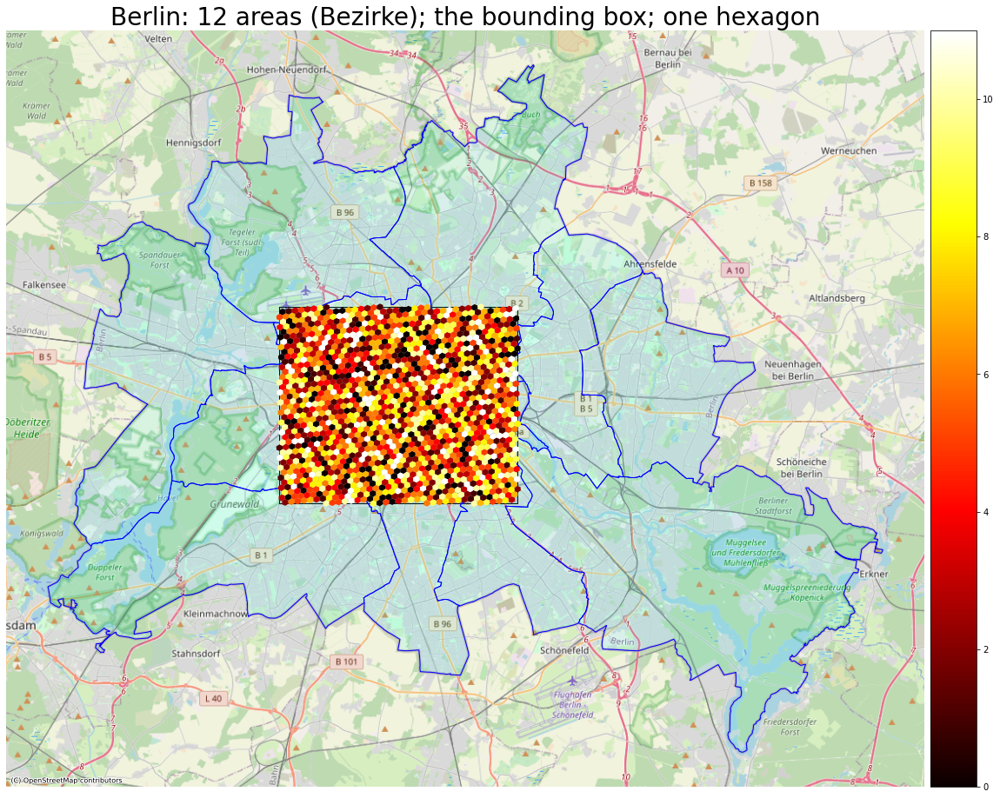

In [34]:
# plot along with the rest
# create figure
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

if True:
    # plot bbox
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("black", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("black", alpha=1.0)
    gdf_bbox.to_crs(epsg = 3857).plot(ax = ax, 
               facecolor=polygon_color_face,
               edgecolor=polygon_color_edge,
               linewidth = 1,
              )
if True:
    # plot counties
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("cyan", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("blue", alpha=1.0)
    gdf_areas.to_crs(epsg = 3857).plot(ax = ax, 
                   facecolor=polygon_color_face,
                   edgecolor=polygon_color_edge,
                   linewidth = 1,
                  )
if False:
    # plot hash of hexagons
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("red", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("red", alpha=1.0)
    gdf_hash.to_crs(epsg = 3857).plot(ax = ax, 
               facecolor=polygon_color_face,
               edgecolor=polygon_color_edge,
               linewidth = 1,
              )
    
if False:
    # plot one chosen hexagon
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("black", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("black", alpha=1.0)
    gdf_hexagon.to_crs(epsg = 3857).plot(ax = ax, 
               facecolor=polygon_color_face,
               edgecolor=polygon_color_edge,
               linewidth = 1,
              )
    
plt.xlabel("Longitude", fontsize = 18)
plt.ylabel("Latitude", fontsize = 18)
plt.title(f"Berlin: {len(gdf_areas)} areas (Bezirke); the bounding box; one hexagon", fontsize = 28)
    
if True:
    # plot hash of hexagons, each hexagon colored by its count
    var = "count"
    dynamic_cmap = "hot"
    dynamic_linewidth = 0.4
    vmin = np.min(gdf_hash[var].values)
    vmax = np.max(gdf_hash[var].values)
    print(f"for real:  vmin={vmin:.3f}, vmax={vmax:.3f}")
    #
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size = "5%", pad = 0.1)
    gdf_hash.to_crs(epsg = 3857).plot(
        ax = ax,
        column = var,
        cmap = dynamic_cmap,
        legend = True,
        cax = cax,
        vmin = vmin,
        vmax = vmax,
        linewidth = dynamic_linewidth,
        zorder = 15,
    )

    
# plot basemap below
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_axis_off() # turn the axis values off


In [35]:
# let's try also to color with a float number
# let's calculate the distance in km between each point and the central station
# first let's add a column with the lat, lon of each hexagon
df_hash["lat_lon"] = df_hash.hexagon.map(lambda x: h3.h3_to_geo(x))
df_hash

,hexagon,geometry,count,lat_lon
0,891f18b20a3ffff,"POLYGON ((13.40245 52.47932, 13.40257 52.47769...",0,"(52.47865983603947, 13.405033322926753)"
1,891f1d4aa27ffff,"POLYGON ((13.35094 52.55505, 13.35106 52.55341...",10,"(52.554385687537035, 13.353529737507056)"
2,891f18b213bffff,"POLYGON ((13.43584 52.47396, 13.43597 52.47232...",11,"(52.47329022377479, 13.438430777303548)"
3,891f1d49b3bffff,"POLYGON ((13.32978 52.46747, 13.32990 52.46584...",11,"(52.466810586137264, 13.332363762138877)"
4,891f1d49ab3ffff,"POLYGON ((13.29367 52.47511, 13.29380 52.47347...",1,"(52.47444865449665, 13.296258012663738)"
...,...,...,...,...
1485,891f18b26cfffff,"POLYGON ((13.34726 52.47102, 13.34739 52.46938...",0,"(52.47035197952496, 13.349848528323173)"
1486,891f1d49ca3ffff,"POLYGON ((13.29371 52.50717, 13.29384 52.50553...",2,"(52.50650491808757, 13.296301266725754)"
1487,891f1d48387ffff,"POLYGON ((13.30229 52.52741, 13.30242 52.52578...",10,"(52.52675250672645, 13.304879462725664)"
1488,891f1d488b3ffff,"POLYGON ((13.37810 52.53207, 13.37823 52.53044...",2,"(52.5314112270418, 13.38069443456717)"


In [36]:
# let's add a column with the distance in km
df_hash["distance"] = df_hash.lat_lon.map(lambda x: utils.get_distance(x, (lat, lon)))
df_hash

,hexagon,geometry,count,lat_lon,distance
0,891f18b20a3ffff,"POLYGON ((13.40245 52.47932, 13.40257 52.47769...",0,"(52.47865983603947, 13.405033322926753)",5.694185
1,891f1d4aa27ffff,"POLYGON ((13.35094 52.55505, 13.35106 52.55341...",10,"(52.554385687537035, 13.353529737507056)",3.428318
2,891f18b213bffff,"POLYGON ((13.43584 52.47396, 13.43597 52.47232...",11,"(52.47329022377479, 13.438430777303548)",7.411731
3,891f1d49b3bffff,"POLYGON ((13.32978 52.46747, 13.32990 52.46584...",11,"(52.466810586137264, 13.332363762138877)",6.943561
4,891f1d49ab3ffff,"POLYGON ((13.29367 52.47511, 13.29380 52.47347...",1,"(52.47444865449665, 13.296258012663738)",7.493025
...,...,...,...,...,...
1485,891f18b26cfffff,"POLYGON ((13.34726 52.47102, 13.34739 52.46938...",0,"(52.47035197952496, 13.349848528323173)",6.224296
1486,891f1d49ca3ffff,"POLYGON ((13.29371 52.50717, 13.29384 52.50553...",2,"(52.50650491808757, 13.296301266725754)",5.357210
1487,891f1d48387ffff,"POLYGON ((13.30229 52.52741, 13.30242 52.52578...",10,"(52.52675250672645, 13.304879462725664)",4.366229
1488,891f1d488b3ffff,"POLYGON ((13.37810 52.53207, 13.37823 52.53044...",2,"(52.5314112270418, 13.38069443456717)",1.037878


for real:  vmin=0.138, vmax=9.374


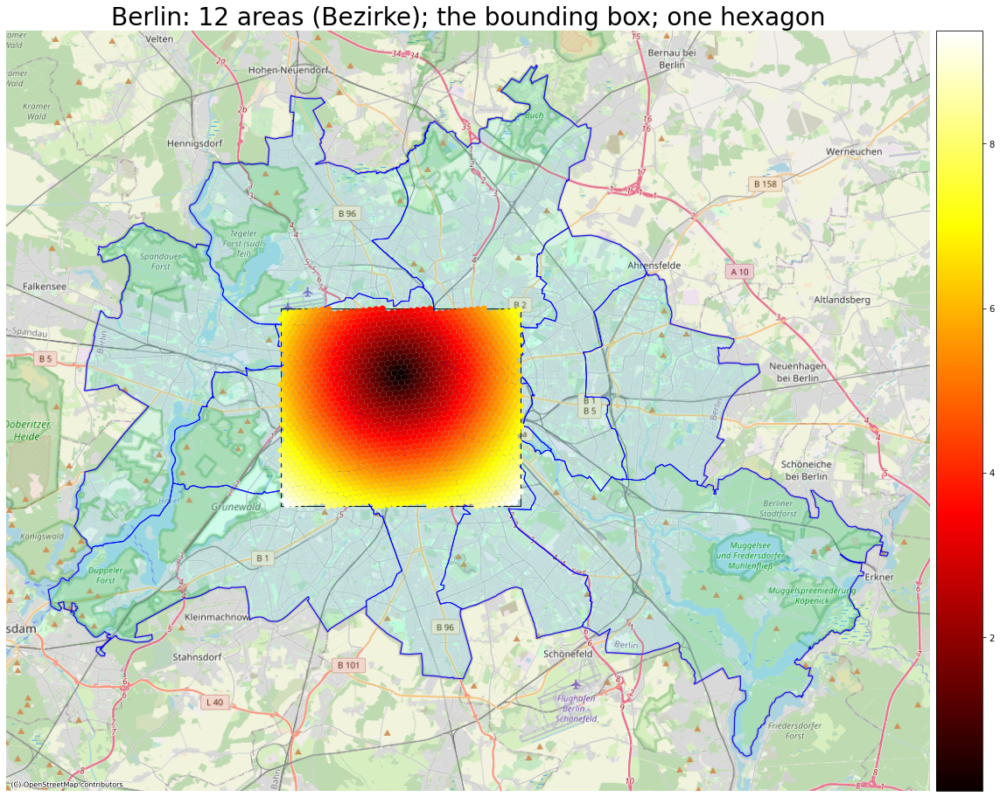

In [37]:
# let's plot coloring by the distance
# create figure
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

if True:
    # plot bbox
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("black", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("black", alpha=1.0)
    gdf_bbox.to_crs(epsg = 3857).plot(ax = ax, 
               facecolor=polygon_color_face,
               edgecolor=polygon_color_edge,
               linewidth = 1,
              )
if True:
    # plot counties
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("cyan", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("blue", alpha=1.0)
    gdf_areas.to_crs(epsg = 3857).plot(ax = ax, 
                   facecolor=polygon_color_face,
                   edgecolor=polygon_color_edge,
                   linewidth = 1,
                  )
if False:
    # plot hash of hexagons
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("red", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("red", alpha=1.0)
    gdf_hash.to_crs(epsg = 3857).plot(ax = ax, 
               facecolor=polygon_color_face,
               edgecolor=polygon_color_edge,
               linewidth = 1,
              )
    
if False:
    # plot one chosen hexagon
    polygon_color_face = matplotlib.colors.colorConverter.to_rgba("black", alpha=0.1)
    polygon_color_edge = matplotlib.colors.colorConverter.to_rgba("black", alpha=1.0)
    gdf_hexagon.to_crs(epsg = 3857).plot(ax = ax, 
               facecolor=polygon_color_face,
               edgecolor=polygon_color_edge,
               linewidth = 1,
              )
    
plt.xlabel("Longitude", fontsize = 18)
plt.ylabel("Latitude", fontsize = 18)
plt.title(f"Berlin: {len(gdf_areas)} areas (Bezirke); the bounding box; one hexagon", fontsize = 28)
    
if True:
    # plot hash of hexagons, each hexagon colored by its count
    var = "distance"
    dynamic_cmap = "hot"
    dynamic_linewidth = 0.4
    vmin = np.min(gdf_hash[var].values)
    vmax = np.max(gdf_hash[var].values)
    print(f"for real:  vmin={vmin:.3f}, vmax={vmax:.3f}")
    #
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size = "5%", pad = 0.1)
    gdf_hash.to_crs(epsg = 3857).plot(
        ax = ax,
        column = var,
        cmap = dynamic_cmap,
        legend = True,
        cax = cax,
        vmin = vmin,
        vmax = vmax,
        linewidth = dynamic_linewidth,
        zorder = 15,
    )

# plot basemap below
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_axis_off() # turn the axis values off